In [1]:
import os
import random

# Import utility functions
from cjm_pil_utils.core import resize_img
from cjm_pytorch_utils.core import set_seed, move_data_to_device

import matplotlib.pyplot as plt

import numpy as np


from PIL import Image

import torch
import torch.nn.functional as F
import torchvision
torchvision.disable_beta_transforms_warning()
from torchvision.tv_tensors import BoundingBoxes, Mask
import torchvision.transforms.v2  as transforms

# Import Mask R-CNN
from torchvision.models.detection import maskrcnn_resnet50_fpn_v2
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor
import cv2

seed = 1234
set_seed(seed)

In [2]:
image_dir = 'data/sofia_data_v2/ground_truth_images'
images_ellipses_dir = 'data/sofia_data_v2/ground_truth_projected_ellipses'

image_dir_items = [i.split(".")[0] for i in os.listdir(image_dir)]
images_ellipses_dir_items = [i.split(".")[0] for i in os.listdir(images_ellipses_dir)]
items = list(set(image_dir_items) & set(images_ellipses_dir_items))
items = sorted(items, key=lambda x: int(x.split('.')[0]))

images_name = [i+'.png' for i in items]
ellipses_name = [i+'.txt' for i in items]

img_dict = {i: os.path.join(image_dir, f'{item}.png') for i, item in enumerate(items)}

# Get the list of image IDs
img_keys = list(img_dict.keys())

# Shuffle the image IDs
random.shuffle(img_keys)

# Define the percentage of the images that should be used for training
train_pct = 0.8
val_pct = 0.2

# Calculate the index at which to split the subset of image paths into training and validation sets
train_split = int(len(img_keys)*train_pct)
val_split = int(len(img_keys)*(train_pct+val_pct))

# Split the subset of image paths into training and validation sets
train_keys = img_keys[:train_split]
val_keys = img_keys[train_split:]

In [3]:
folder_names = 'LDEM_0_75E_0_30N_float_60fov_1024_1024_'
directory = 'data/fixed_sofia_data/processed_real_lunar_data_complete_height_adjusted'

off_nadir_folders = [folder for folder in os.listdir(directory) if folder.startswith(folder_names)]

all_img_dirs = []

for off_nadir_folder in off_nadir_folders:
    root_dir = os.path.join(directory, off_nadir_folder)
    image_dir = os.path.join(root_dir, 'ground_truth_images')
    # print(image_dir)
    
    images_boxes_dir = os.path.join(root_dir, 'ground_truth_bounding_boxes')
    images_ellipses_dir = os.path.join(root_dir, 'ground_truth_projected_ellipses')
    
    image_dir_items = [i.split(".")[0] for i in os.listdir(image_dir)]
    images_boxes_dir_items = [i.split(".")[0] for i in os.listdir(images_boxes_dir)]
    images_ellipses_dir_items = [i.split(".")[0] for i in os.listdir(images_ellipses_dir)]
    items = list(set(image_dir_items) & set(images_boxes_dir_items) & set(images_ellipses_dir_items))
    items = sorted(items, key=lambda x: int(x.split('.')[0]), reverse=True)
    
    for item in items:
        img_dir = os.path.join(image_dir, f'{item}.png')
        
        annot_file_path = os.path.join(images_ellipses_dir, f'{item}.txt') 
        with open(annot_file_path, 'r') as f:
            lines = f.readlines()[1:]
            if len(lines) != 0:
                all_img_dirs.append(img_dir)
        
img_dict = {i: item for i, item in enumerate(all_img_dirs)}
# Get the list of image IDs
img_keys = list(img_dict.keys())

# Shuffle the image IDs
random.shuffle(img_keys)

# Define the percentage of the images that should be used for training
train_pct = 0.8
val_pct = 0.2

# Calculate the index at which to split the subset of image paths into training and validation sets
train_split = int(len(img_keys)*train_pct)
val_split = int(len(img_keys)*(train_pct+val_pct))

# Split the subset of image paths into training and validation sets
train_keys = img_keys[:train_split]
val_keys = img_keys[train_split:]

In [2]:
device = 'cpu'
dtype = torch.float32
class_names = ['background']+['crater']

In [3]:
# Initialize a Mask R-CNN model with pretrained weights
model = maskrcnn_resnet50_fpn_v2(weights='DEFAULT')

# Get the number of input features for the classifier
in_features_box = model.roi_heads.box_predictor.cls_score.in_features
in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels

# Get the numbner of output channels for the Mask Predictor
dim_reduced = model.roi_heads.mask_predictor.conv5_mask.out_channels

# Replace the box predictor
model.roi_heads.box_predictor = FastRCNNPredictor(in_channels=in_features_box, num_classes=len(class_names))

# Replace the mask predictor
model.roi_heads.mask_predictor = MaskRCNNPredictor(in_channels=in_features_mask, dim_reduced=dim_reduced, num_classes=len(class_names))

# Set the model's device and data type
model.to(device=device, dtype=dtype)

# Add attributes to store the device and model name for later reference
model.device = device
model.name = 'maskrcnn_resnet50_fpn_v2'

In [4]:
weights_path = "pytorch-mask-r-cnn-instance-segmentation/2024-05-19_19-15-50_fix_gt/maskrcnn_resnet50_fpn_v2.pth"
model.load_state_dict(torch.load(weights_path))

<All keys matched successfully>

In [5]:
import glob

image_files = glob.glob('./pangu/*.png')
image_files

['./pangu/280.png',
 './pangu/0_r-146600000000_el-239_az-266_local_el--1.png',
 './pangu/0_r-146600000000_el-50_az-349_local_el-0.png',
 './pangu/260.png',
 './pangu/0_r-146600000000_el-140_az-349_local_el-90.0.png',
 './pangu/140.png',
 './pangu/400.png',
 './pangu/1_flipped.png',
 './pangu/14.png',
 './pangu/8.png',
 './pangu/0_r-146600000000_el-192_az-318_local_el-29.99986734157605.png',
 './pangu/180.png',
 './pangu/360.png',
 './pangu/0_r-146599999999_el-166_az-248_local_el-0.png',
 './pangu/2.png',
 './pangu/4.png',
 './pangu/0_r-146599999999_el--38_az-218_local_el-0.png',
 './pangu/30.png',
 './pangu/0_r-146600000000_el--59_az-252_local_el--1.png',
 './pangu/22.png',
 './pangu/0_r-146600000000_el-186_az-225_local_el--1.png',
 './pangu/0_r-146600000000_el-148_az-274_local_el-29.99986734157605.png',
 './pangu/0_r-146599999999_el-165_az-332_local_el-59.99988909524795.png',
 './pangu/380.png',
 './pangu/582.png',
 './pangu/0_r-146600000000_el-14_az-187_local_el-59.99988909524795.png

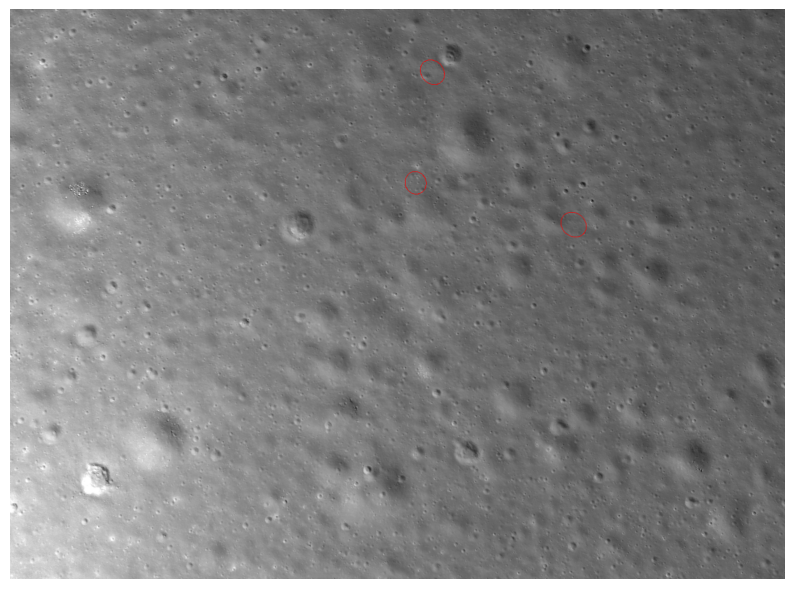

Error
Error


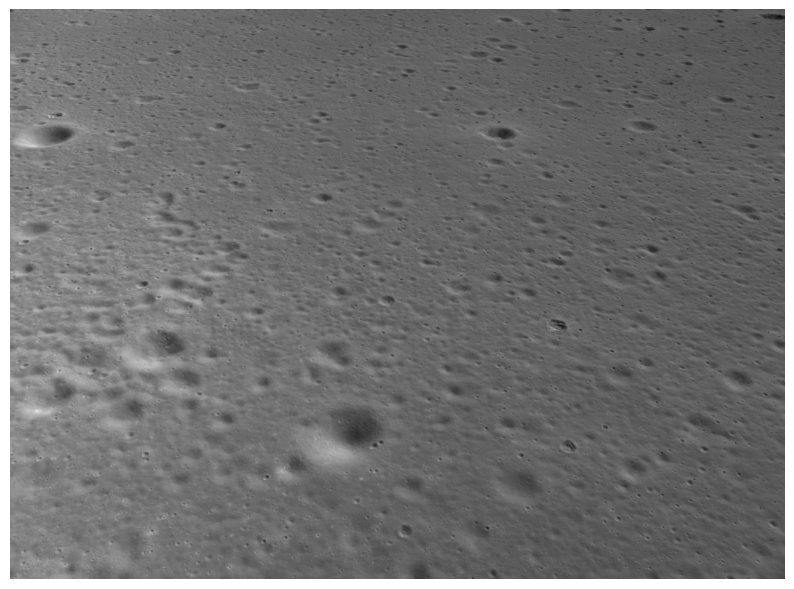

Error
Error


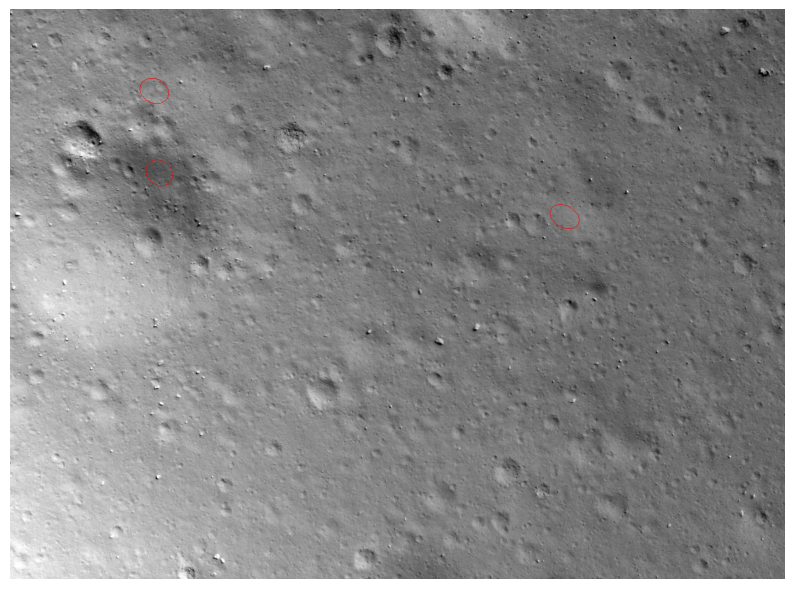

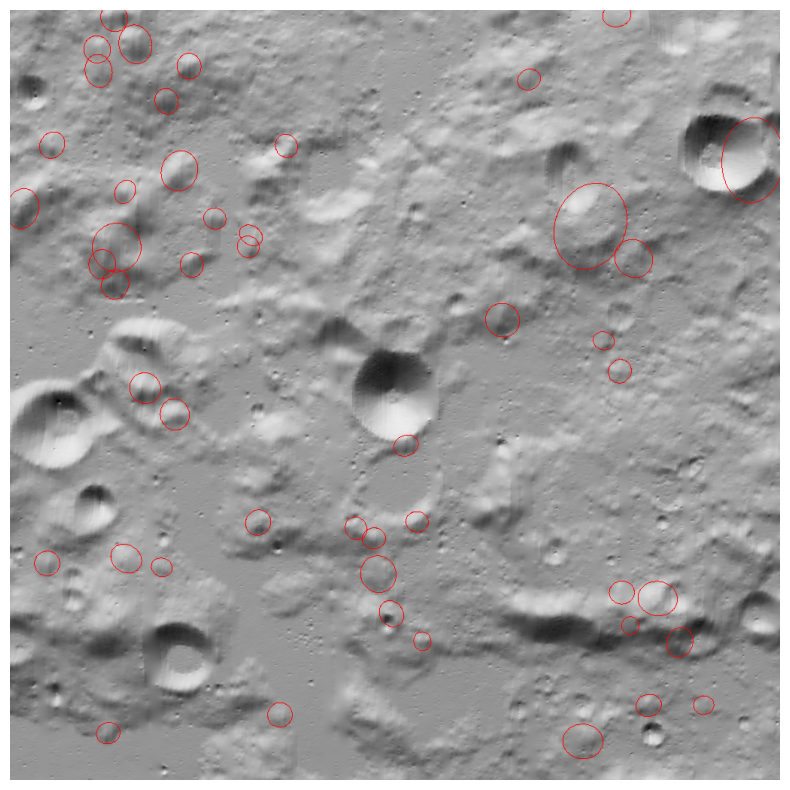

Error


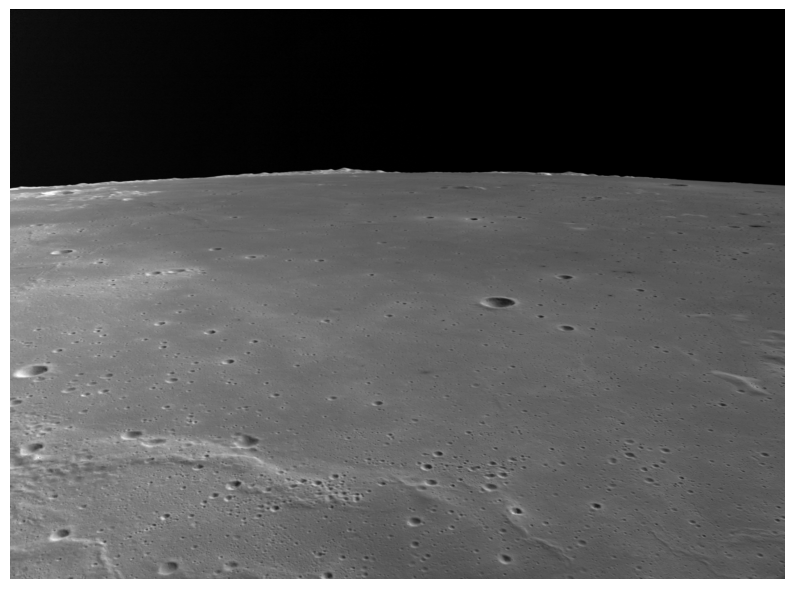

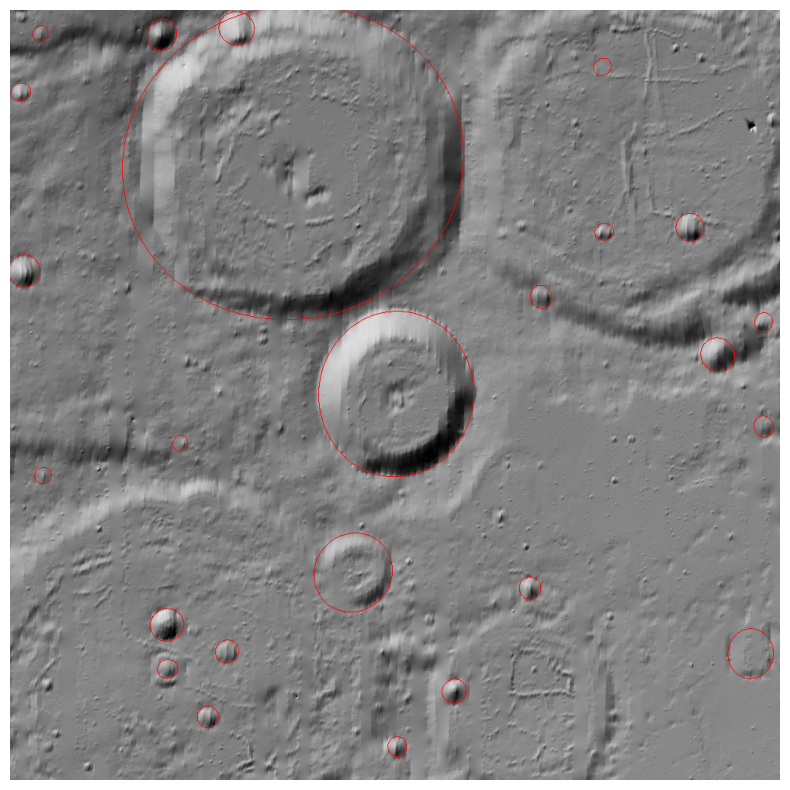

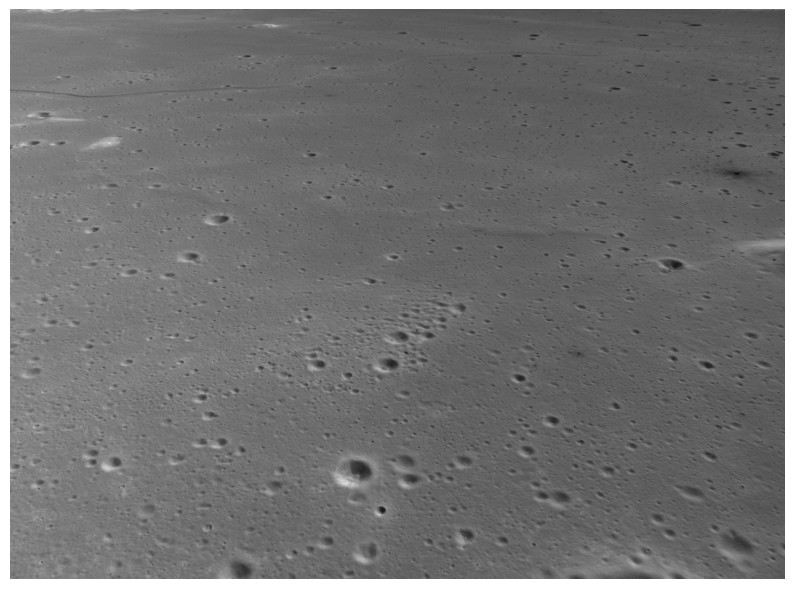

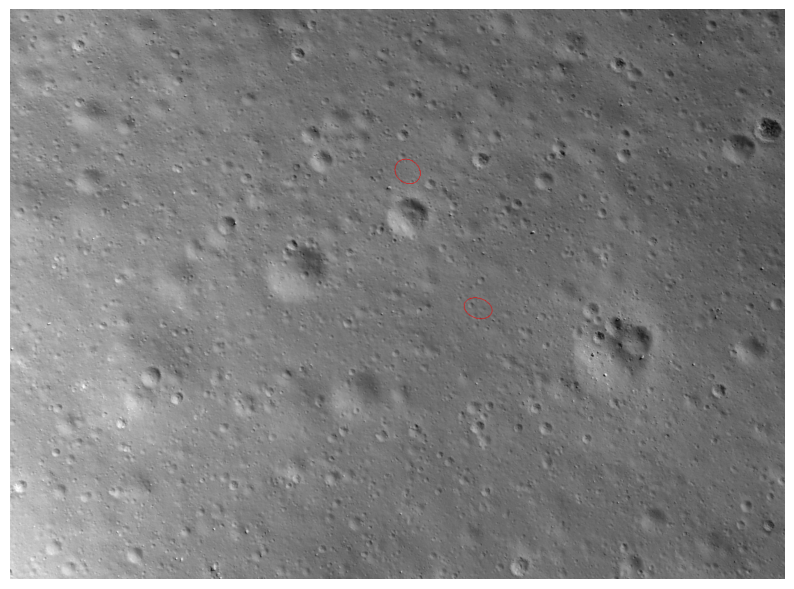

Error


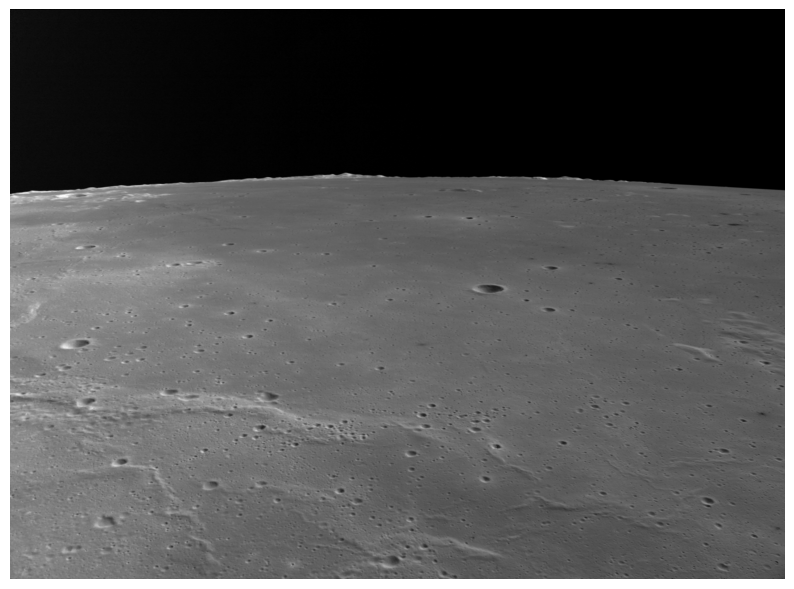

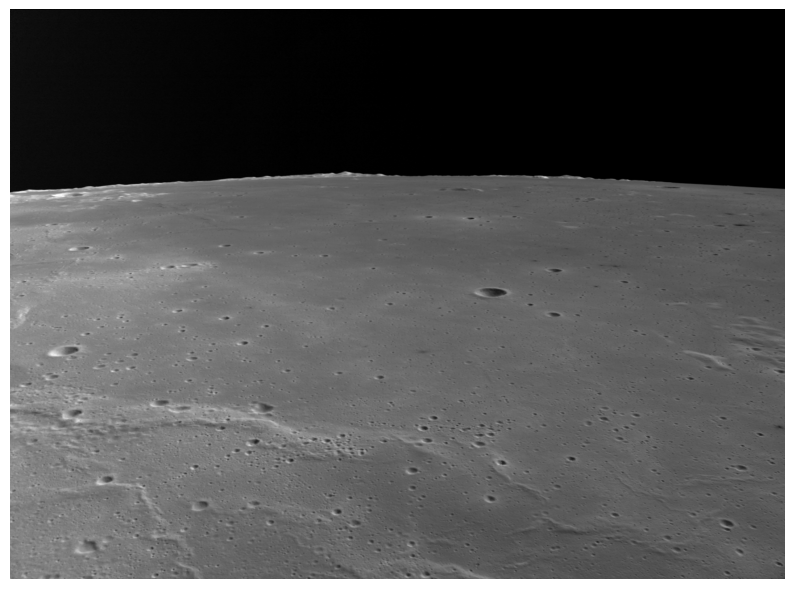

Error


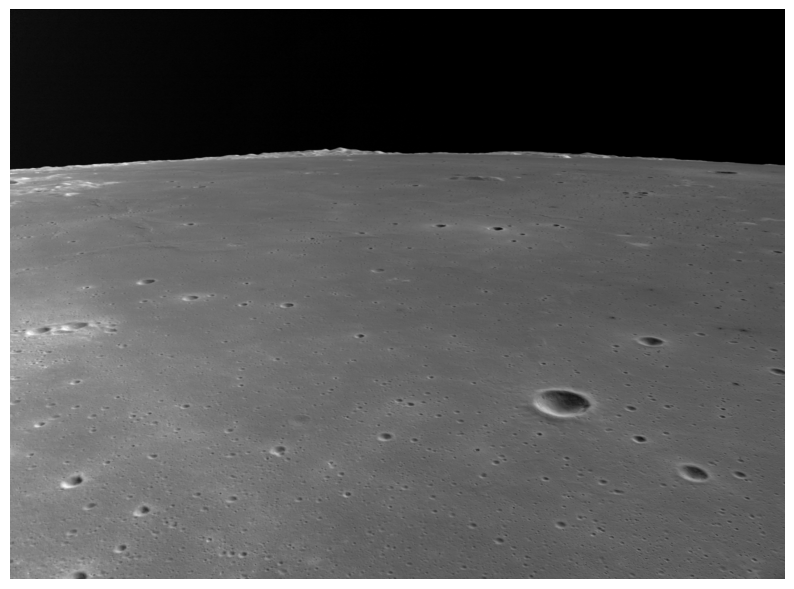

Error


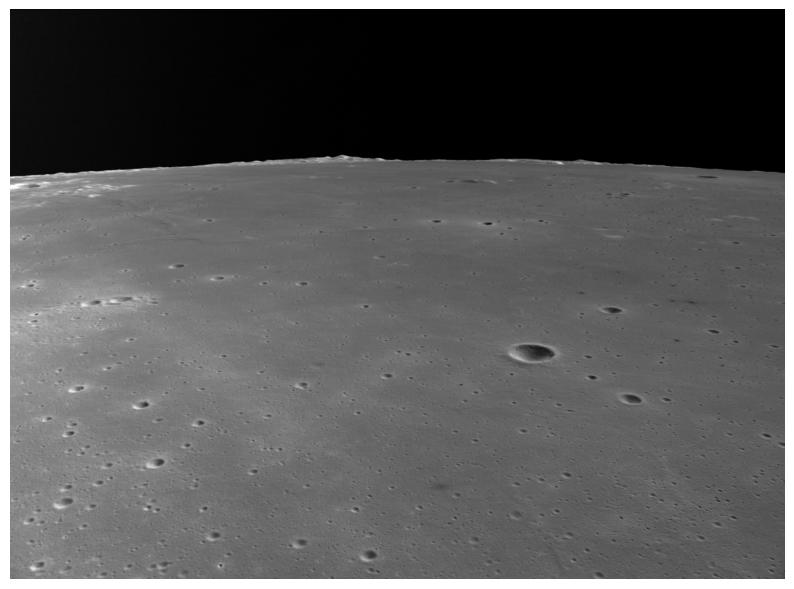

Error


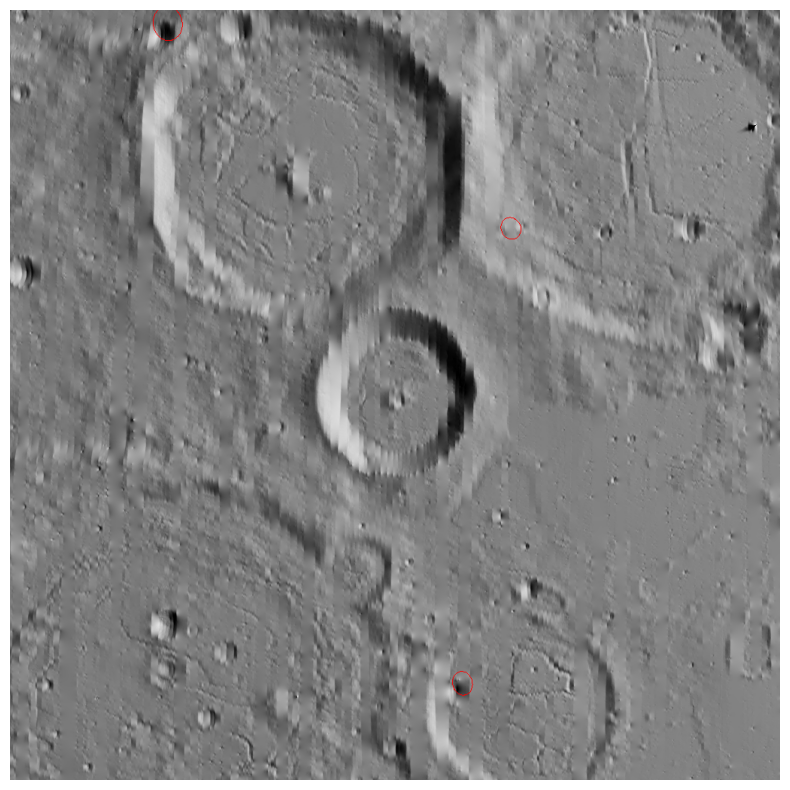

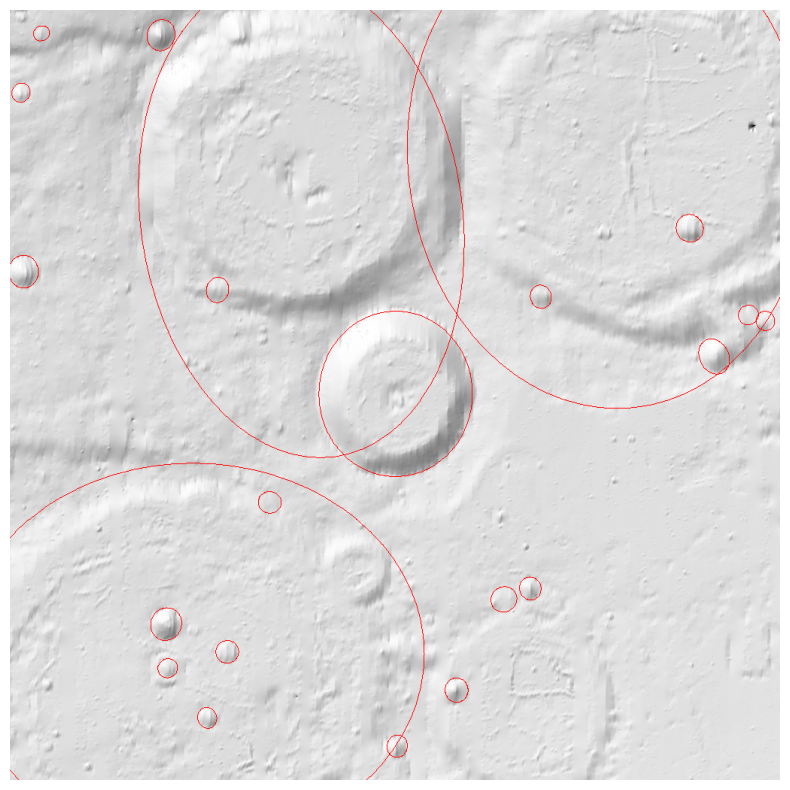

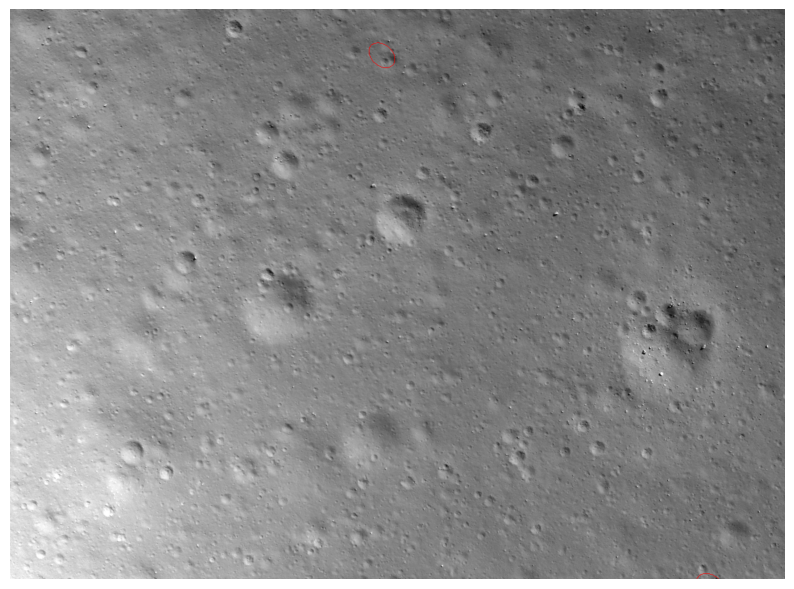

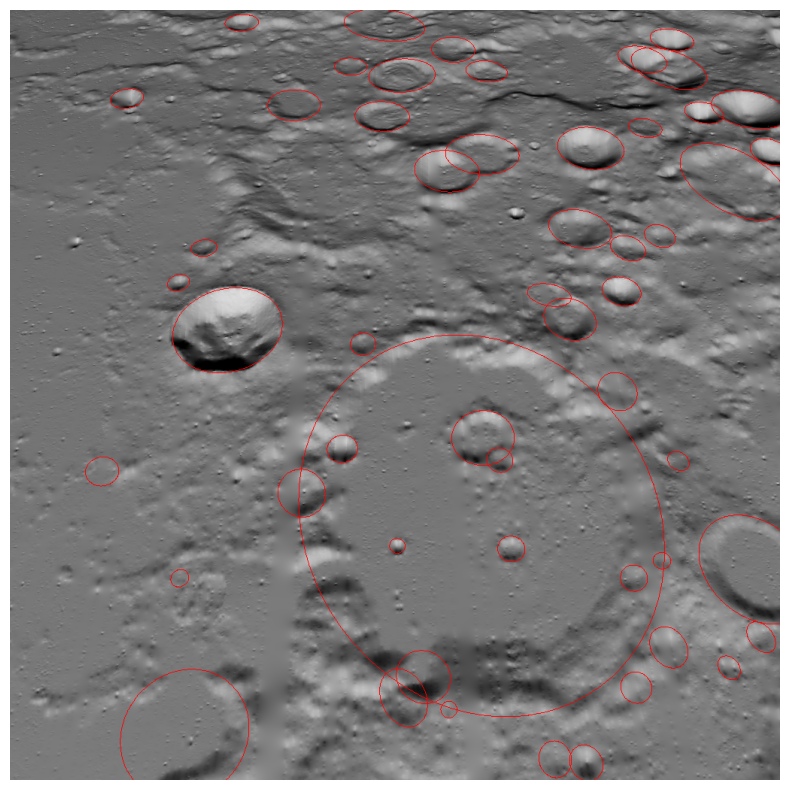

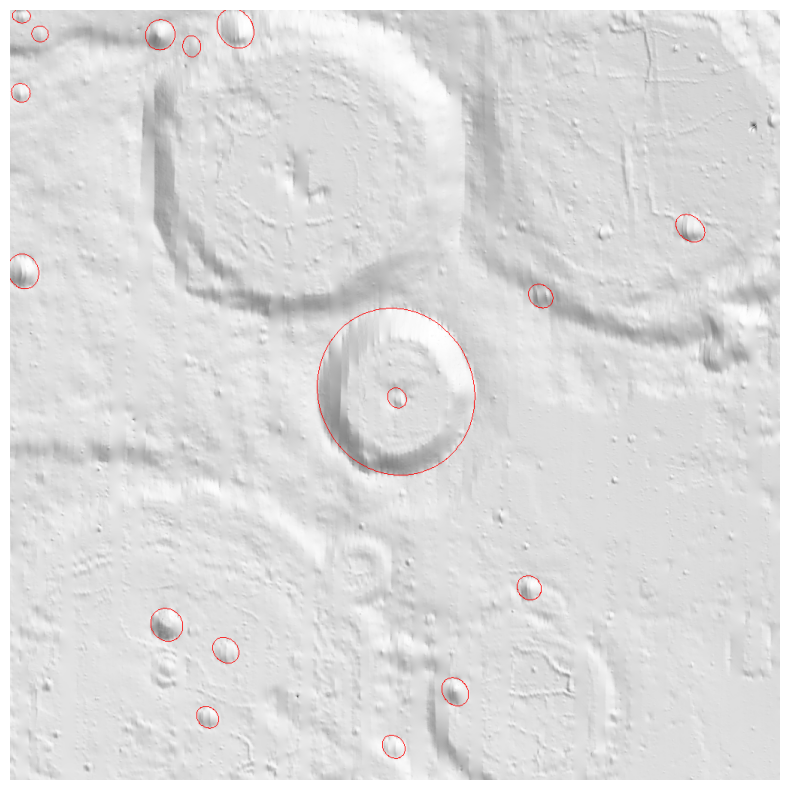

...

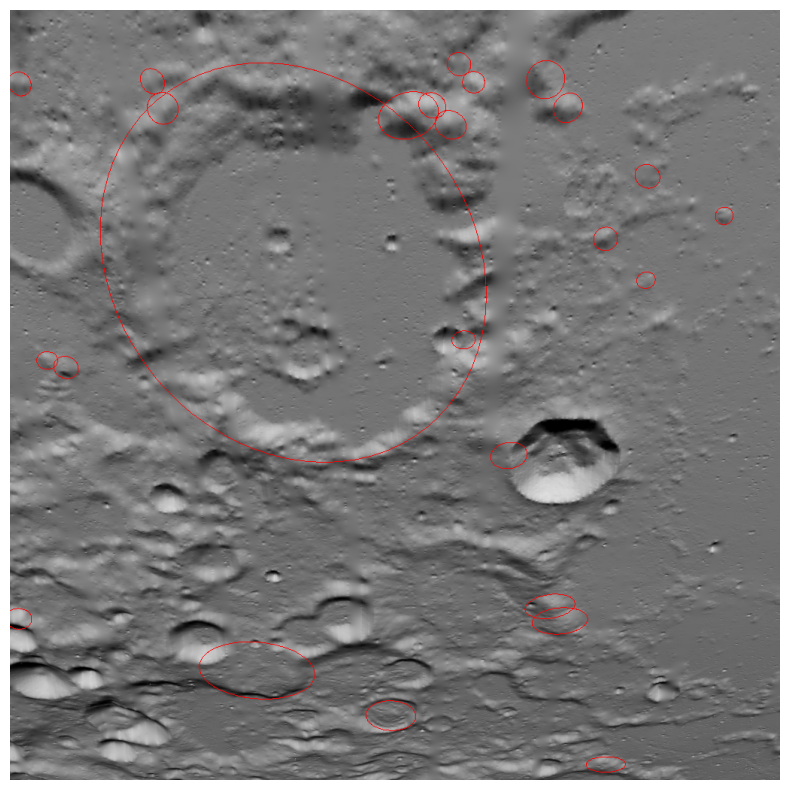

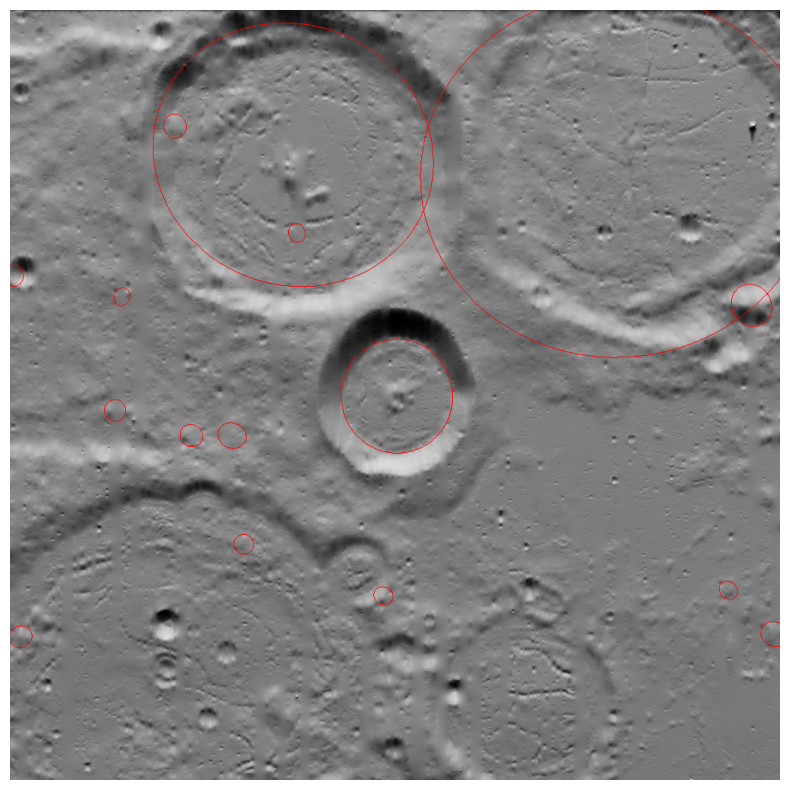

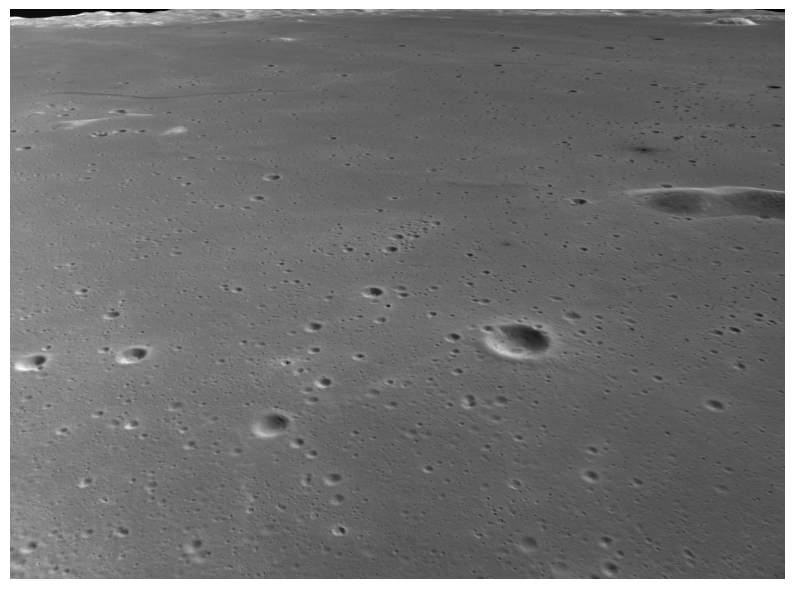

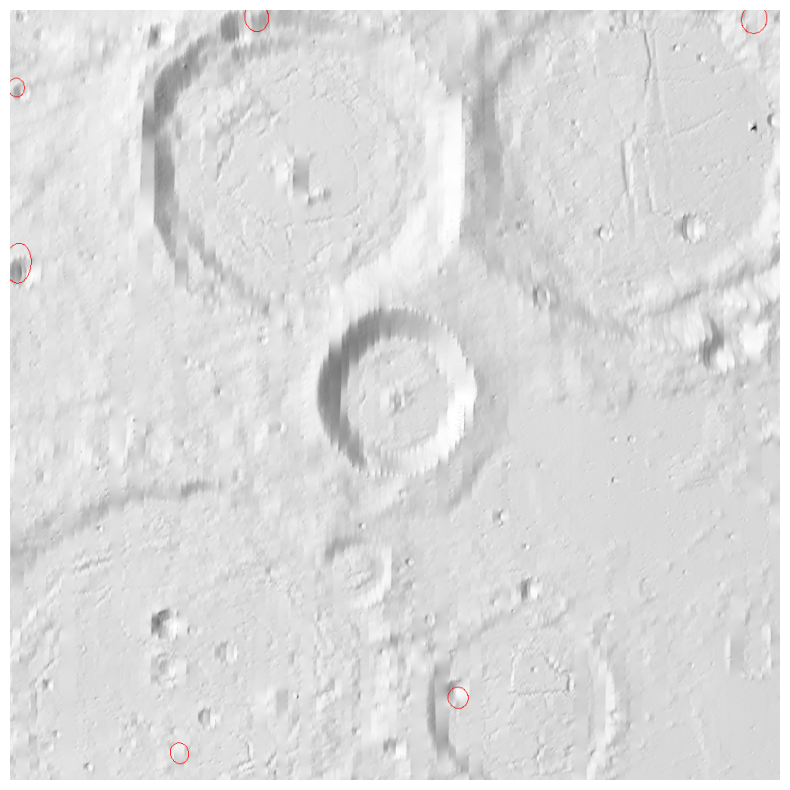

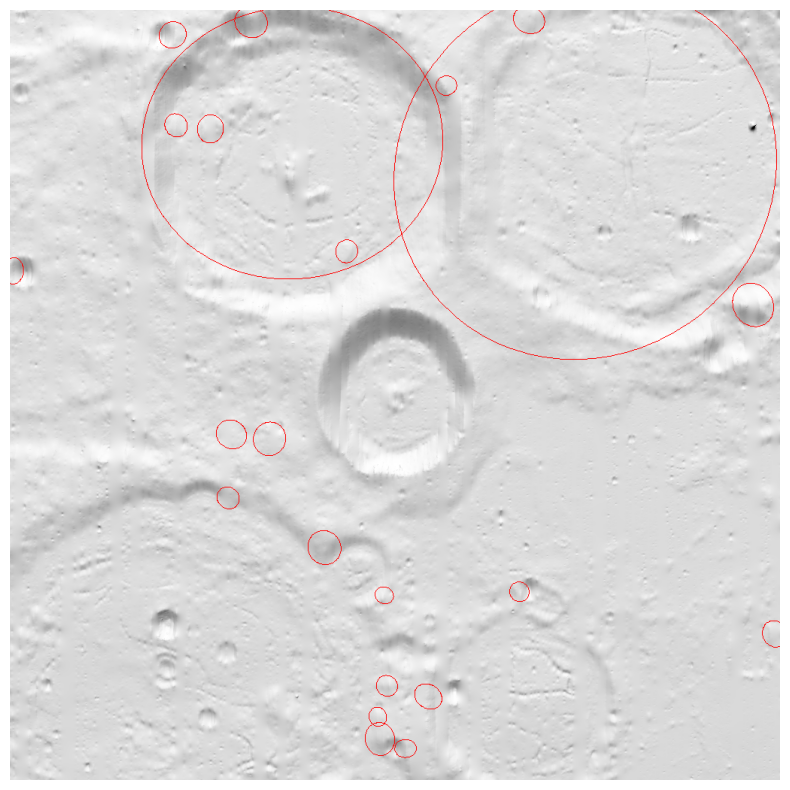

Error


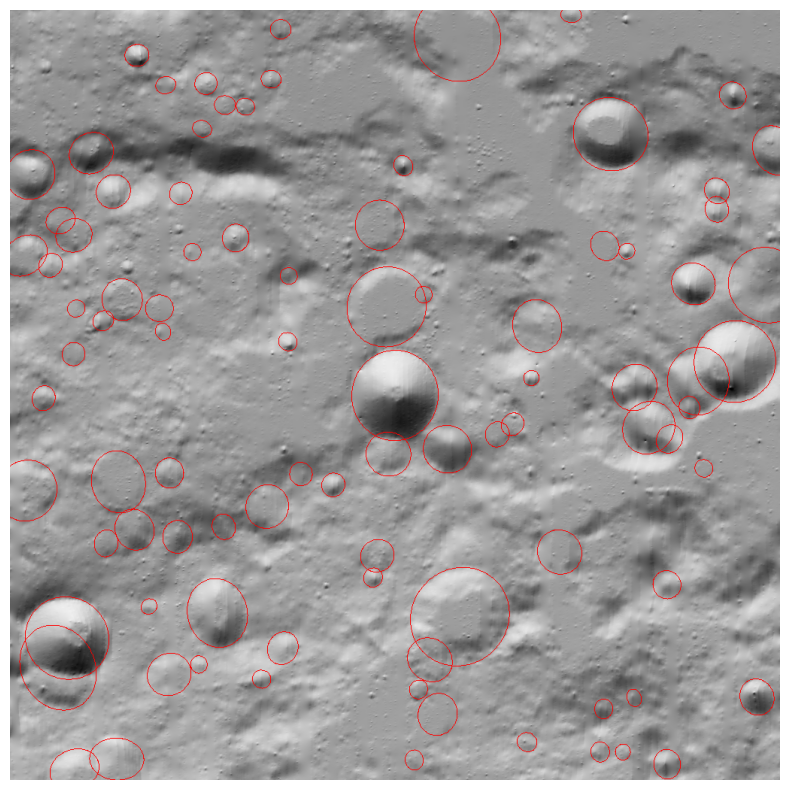

Error


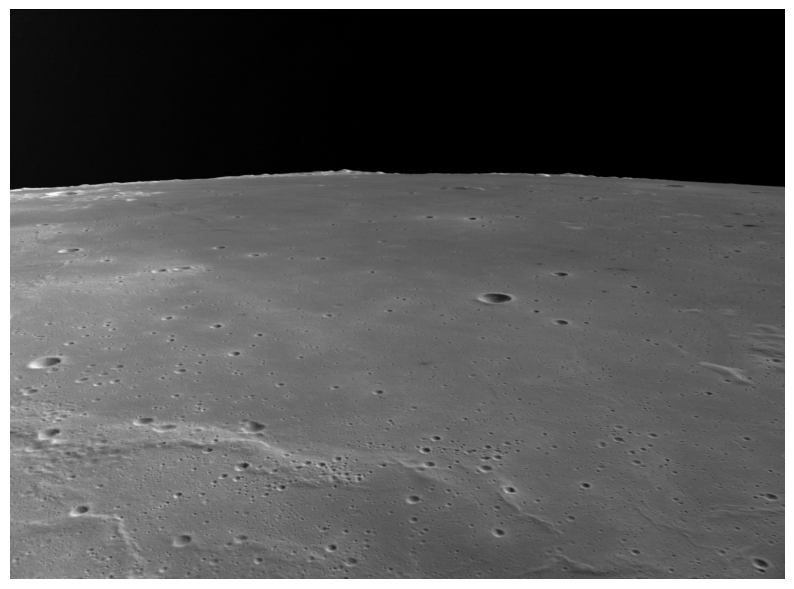

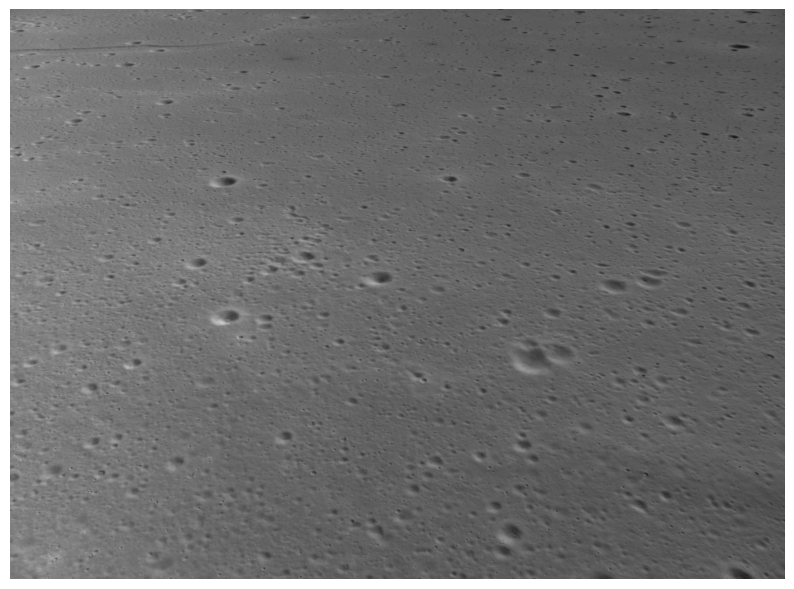

Error


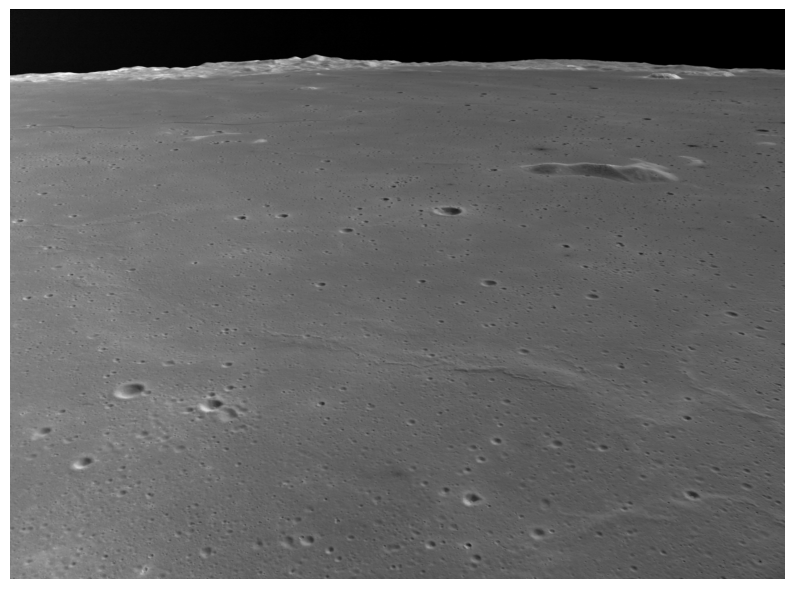

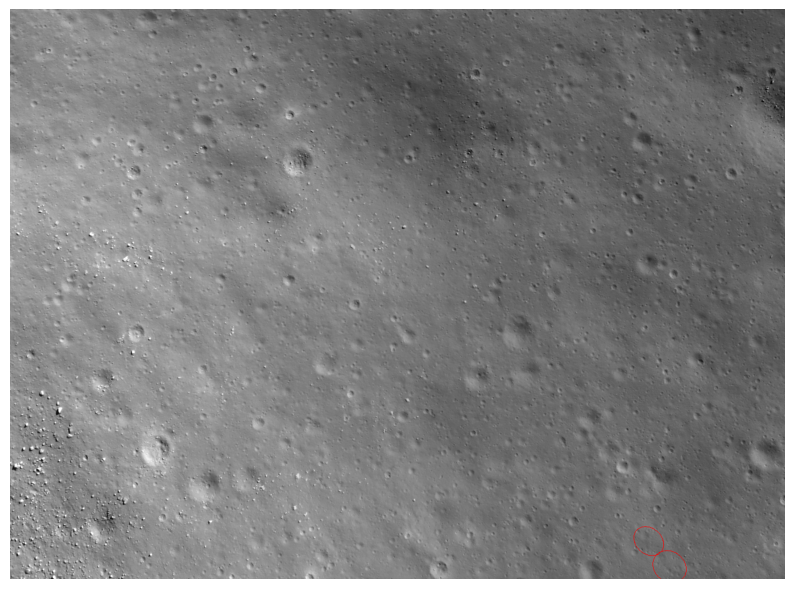

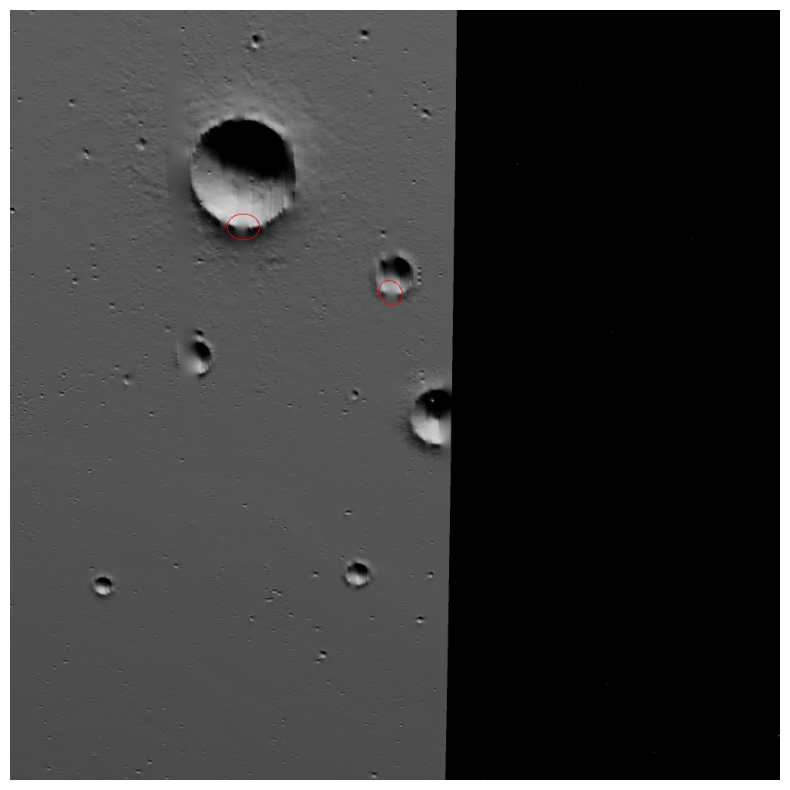

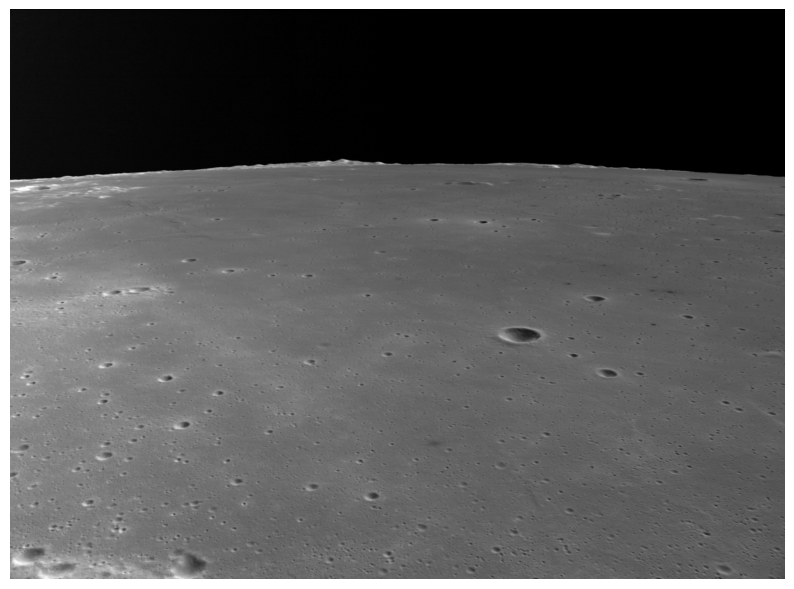

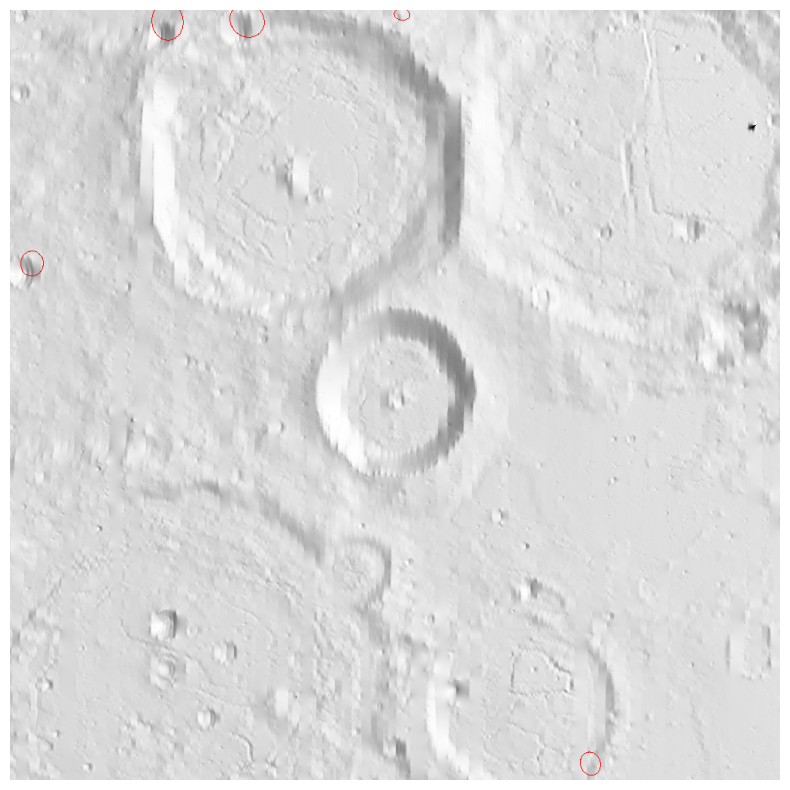

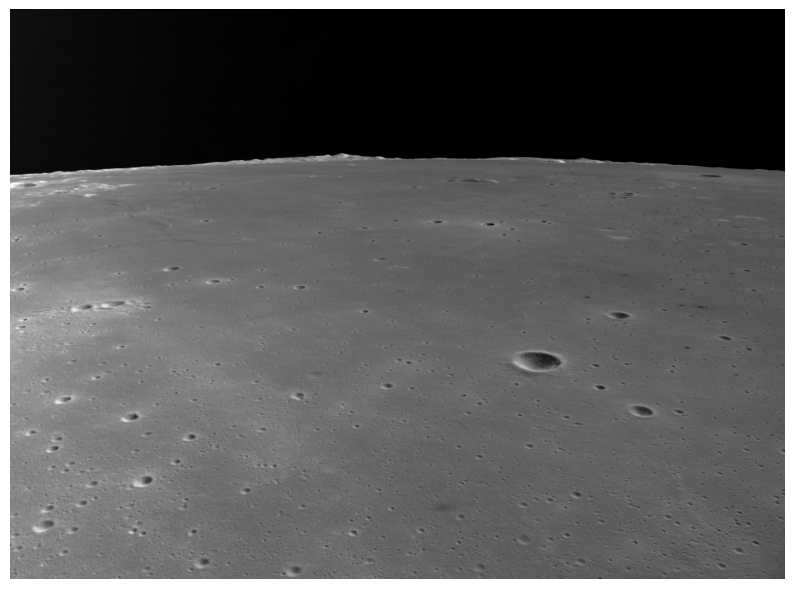

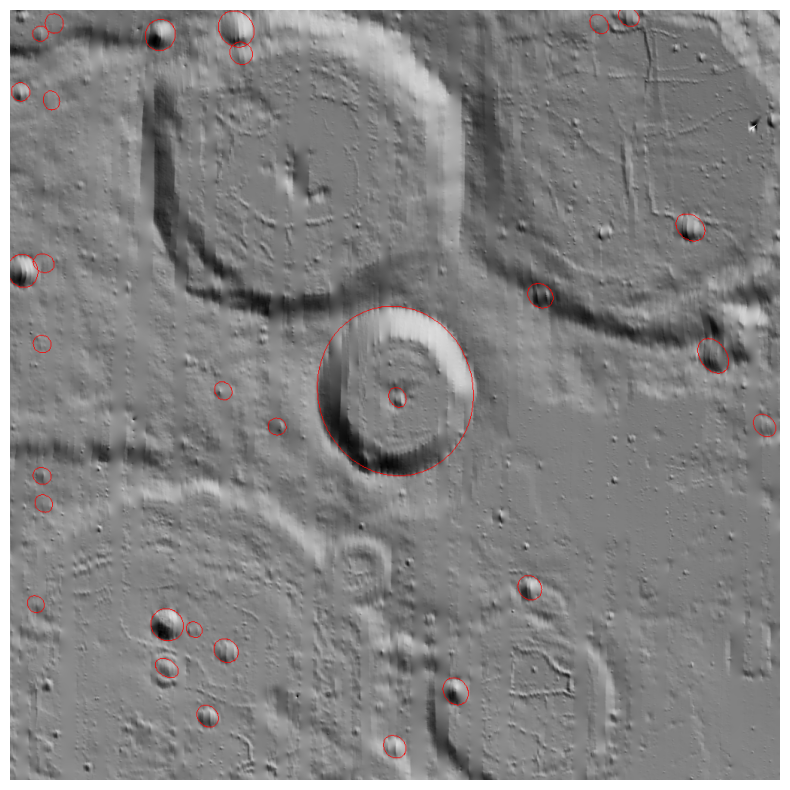

KeyboardInterrupt: 

In [6]:
for test_file in image_files:
# test_file = 'pangu/0_r-146599999999_el-42_az-209_local_el-59.99988909524795.png'

    train_sz = 1024
    threshold = 0.5

    test_img = Image.open(test_file).convert('RGB')
    input_img = resize_img(test_img, target_sz=train_sz, divisor=1)
    input_tensor = transforms.Compose([transforms.ToImage(), transforms.ToDtype(torch.float32, scale=True)])(input_img)[None].to(device)
    min_img_scale = min(test_img.size) / min(input_img.size)

    model.eval()

    model.to(device)
    with torch.no_grad():
        model_output = model(input_tensor)

    model_output = move_data_to_device(model_output, 'cpu')

    # Filter the output based on the confidence threshold
    scores_mask = model_output[0]['scores'] > threshold

    # Scale and stack the predicted segmentation masks
    pred_masks = F.interpolate(model_output[0]['masks'][scores_mask], size=test_img.size[::-1])
    try : 
        pred_masks = torch.concat([Mask(torch.where(mask >= threshold, 1, 0), dtype=torch.bool) for mask in pred_masks])   


        input_img_np = np.array(resize_img(input_img, target_sz=1024, divisor=1))

        # draw Pred
        pred_ellipses = []
        for mask in pred_masks:
            
            # Find contours of the mask
            contours, _ = cv2.findContours(mask.numpy().astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            if len(contours)>1:
                    contours = [max(contours, key=cv2.contourArea)]
            # Fit ellipse to the contour
            if len(contours[0]) >=5:
                ellipse_params = cv2.fitEllipse(contours[0]) #((x,y), (majorAxis, minorAxis), angle(degree))
            
                param = []
                param.append(ellipse_params[0][0])
                param.append(ellipse_params[0][1])
                param.append(ellipse_params[1][0])
                param.append(ellipse_params[1][1])
                param.append(ellipse_params[2])
                pred_ellipses.append(param)
                
                ellipse_area = np.pi * (ellipse_params[1][0] / 2) * (ellipse_params[1][1] / 2)
                ellipse_peri = 2 * np.pi * np.sqrt(ellipse_area/np.pi)
                contour_peri = cv2.arcLength(contours[0], closed=True)
                
                T = ellipse_peri/contour_peri if ellipse_peri <= contour_peri else contour_peri/ellipse_peri
                if T >= 0.8: #ellipse_index_threshhold
                # Plot the contour
                    cv2.ellipse(input_img_np, ellipse_params, color=(255, 0, 0), thickness=1)

                        
        # pred_bboxes = BoundingBoxes(model_output[0]['boxes'][scores_mask]*min_img_scale, format='xyxy', canvas_size=input_img.size[::-1])   
        # pred_bboxes =  pred_bboxes.round(decimals=3).numpy().tolist()

        # input_img_np = cv2.rotate(input_img_np, cv2.ROTATE_180)
        plt.figure(figsize=(10, 10))  # Set the figure size to display the image at its full size
        plt.imshow(input_img_np)
        plt.axis('off')
        plt.show()
    except: 
        print("Error")

